# One-Step Fall Detection Using YOLOv8

## Step 1: Environment Setup
### This section prepares the Google Colab environment and imports the required libraries for the fall detection project.

In [ ]:
from google.colab import drive
import os
import yaml
import glob
import cv2
from google.colab.patches import cv2_imshow

# 1. Mount Google Drive
drive.mount('/content/drive')

# 2. Install YOLOv8
!pip install -q ultralytics
from ultralytics import YOLO

Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 76.5 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## Step 2: YOLv8 Dataset Configuration
### This section creates the `data.yaml` configuration file required by YOLOv8. The file defines the dataset paths and class labels used for model training and evaluation.

In [ ]:
# Define the path where you uploaded your folder in Google Drive
# Make sure this matches exactly where you dropped 'fall_detection_project'
base_path = '/content/drive/MyDrive/COS30018_fall_detection_project'

# The assignment requires 0="fall detected", 1="walk", 2="sit"
dataset_yaml = {
    'path': base_path,
    'train': 'images/train',      # Your pre-split training data
    'val': 'images/val',          # Your pre-split validation data
    'test': 'images/test',        # Your self-collected unseen test data (50+ per class)
    'nc': 3,
    'names': {0: 'fall detected', 1: 'walk', 2: 'sit'}
}

# Save the configuration as a YAML file
yaml_path = '/content/data.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(dataset_yaml, f, sort_keys=False)

print(f"data.yaml created successfully at {yaml_path}")

data.yaml created successfully at /content/data.yaml


## Verify the location of the generated YAML file

In [ ]:
import os

for root, dirs, files in os.walk('/content/drive/MyDrive'):
    if 'data.yaml' in files:
        print(root)

/content/drive/MyDrive/plant_plucking.yolov8
/content/drive/MyDrive/Plant_Project/plant.yolov11
/content/drive/MyDrive/COS30018_fall_detection_project


## Step 3: Model Training
### This section trains the YOLOv8 Nano model using the prepared fall detection dataset. Transfer learning, data augmentation, and early stopping are applied to improve model performance and generalization.

In [ ]:
# Initialize YOLOv8 Nano for the one-step fall detection architecture
model = YOLO('yolov8n.pt')

print("\n--- Starting Training (Task 1: One-Step Architecture) ---")
# Train the model using the configured dataset
results = model.train(
    data=yaml_path,
    epochs=50,
    imgsz=640,
    batch=16,
    patience=15, # Stops training early if validation metrics don't improve

    # Save training results
    project=os.path.join(base_path, 'runs'),
    name='fall_detection_one_step',
    exist_ok=True,

    # Apply transfer learning using pre-trained weights
    pretrained=True,

    # --- Augmentations for Small Datasets ---
    # These parameters help combat the slight class imbalance and limited data
    hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, # Color jitter
    degrees=10.0,                      # Slight rotations
    translate=0.1,                     # Image translation
    scale=0.5,                         # Zoom in/out
    fliplr=0.5,                        # Horizontal flips (good for human poses)
    mosaic=1.0                         # Combines 4 images into 1 context
)


--- Starting Training (Task 1: One-Step Architecture) ---
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=10.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=fall_detection_one_step, nbs=64, nms=Fals

## Step 4: Model Evaluation and Performance Analysis
### This section evaluates the trained YOLOv8 model using the unseen test dataset. Key performance metrics, including mAP@50 and mAP@50-95, are generated to assess the effectiveness of the one-step fall detection architecture.


In [ ]:
print("\n--- Running Final Evaluation on Test Set ---")

# Load the best model weights obtained during training
best_weights_path = os.path.join(base_path, 'runs/fall_detection_one_step/weights/best.pt')

# Evaluate the model if the trained weights exist
if os.path.exists(best_weights_path):
    # Load the best-performing model
    best_model = YOLO(best_weights_path)

    # Evaluate the model using the unseen test dataset
    metrics = best_model.val(data=yaml_path, split='test')

    # Display key object detection performance metrics
    print(f"\nTest mAP@50: {metrics.box.map50:.3f}")
    print(f"Test mAP@50-95: {metrics.box.map:.3f}")

    # Inform the user where the evaluation outputs are stored
    print("\n[NOTE FOR REPORT]: Check your Drive folder at:")
    print(f"{os.path.join(base_path, 'runs/fall_detection_one_step/')}")
    print("Download the 'confusion_matrix.png' and 'results.png' for your critical analysis section.")
else:
    print("Error: best.pt not found. Check if training completed successfully.")


--- Running Final Evaluation on Test Set ---
Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA A100-SXM4-40GB, 40441MiB)
Model summary (fused): 73 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 7.9±16.5 ms, read: 4.6±5.0 MB/s, size: 3784.2 KB)
requirements: Ultralytics requirement ['pi-heif'] not found, attempting AutoUpdate...
val: Scanning /content/drive/MyDrive/COS30018_fall_detection_project/labels/test... 1 images, 0 backgrounds, 0 corrupt: 0% ──────────── 1/361 5.8s/it 1.7s<34:55requirements: Ultralytics requirement ['pi-heif'] not found, attempting AutoUpdate...
requirements: Ultralytics requirement ['pi-heif'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 2 packages in 189ms
Prepared 1 package in 24ms
Installed 1 package in 2ms
 + pi-heif==1.3.0

requirements: AutoUpdate success ✅ 0.4s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect

Using Py

## Step 5: Inference on Test Images
### This section demonstrates the performance of the trained YOLOv8 model on unseen test images. Predicted activity labels and confidence scores are displayed to provide a qualitative assessment of the model's classification performance.

## 5.1 Sample Prediction Results
### This subsection presents sample prediction results generated by the trained YOLOv8 model on selected test images. The predicted activity labels and confidence scores are displayed for qualitative evaluation.


--- Running Inference on Test Examples ---

Inferencing: 42EDEF58-84F7-44ED-881D-8F9F7317E312_jpg.rf.eO7FhvC4krzTMmiZiI2n.jpg

image 1/1 /content/drive/MyDrive/COS30018_fall_detection_project/images/test/42EDEF58-84F7-44ED-881D-8F9F7317E312_jpg.rf.eO7FhvC4krzTMmiZiI2n.jpg: 640x384 1 fall detected, 58.2ms
Speed: 2.6ms preprocess, 58.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 384)
Results saved to /content/drive/MyDrive/COS30018_fall_detection_project/runs/predictions_one_step


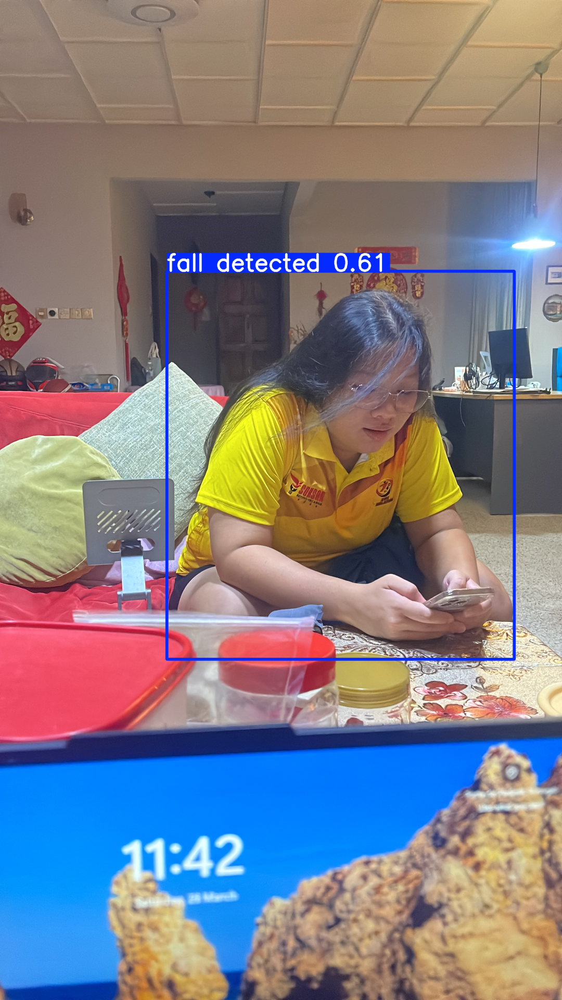


Inferencing: 6e00bc41-b0d0-4b1f-bdd7-97daaeeedd14_jpg.rf.wBMm4Y6az9ofrxZnEPHu.jpg

image 1/1 /content/drive/MyDrive/COS30018_fall_detection_project/images/test/6e00bc41-b0d0-4b1f-bdd7-97daaeeedd14_jpg.rf.wBMm4Y6az9ofrxZnEPHu.jpg: 640x384 (no detections), 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)
Results saved to /content/drive/MyDrive/COS30018_fall_detection_project/runs/predictions_one_step


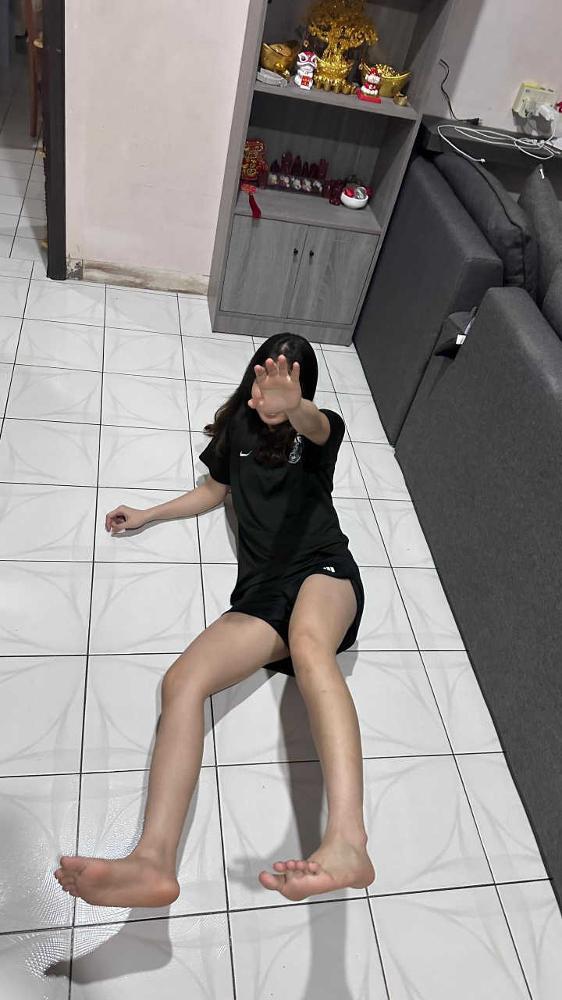


Inferencing: be236f93-c619-47f4-bb3b-994db68d74ab_jpg.rf.TlPjmB8Fd57mUCh06jsN.jpg

image 1/1 /content/drive/MyDrive/COS30018_fall_detection_project/images/test/be236f93-c619-47f4-bb3b-994db68d74ab_jpg.rf.TlPjmB8Fd57mUCh06jsN.jpg: 640x480 2 walks, 60.0ms
Speed: 2.8ms preprocess, 60.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /content/drive/MyDrive/COS30018_fall_detection_project/runs/predictions_one_step


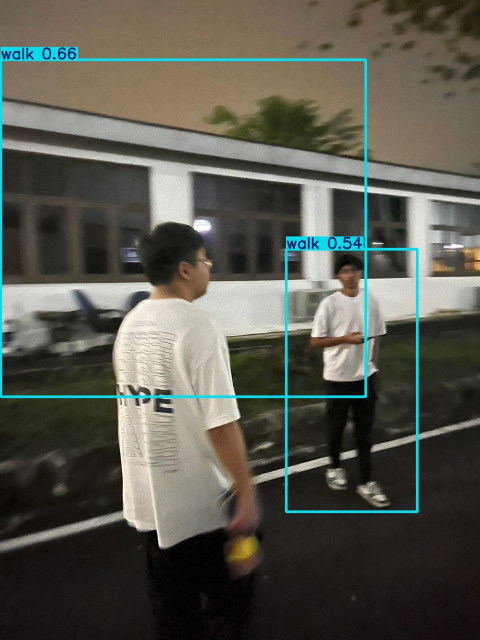


Inferencing: f355e221-8c08-4439-affc-ece668b997fa_jpg.rf.UNHzonQ8gcJ6aGawhDJB.jpg

image 1/1 /content/drive/MyDrive/COS30018_fall_detection_project/images/test/f355e221-8c08-4439-affc-ece668b997fa_jpg.rf.UNHzonQ8gcJ6aGawhDJB.jpg: 640x384 (no detections), 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)
Results saved to /content/drive/MyDrive/COS30018_fall_detection_project/runs/predictions_one_step


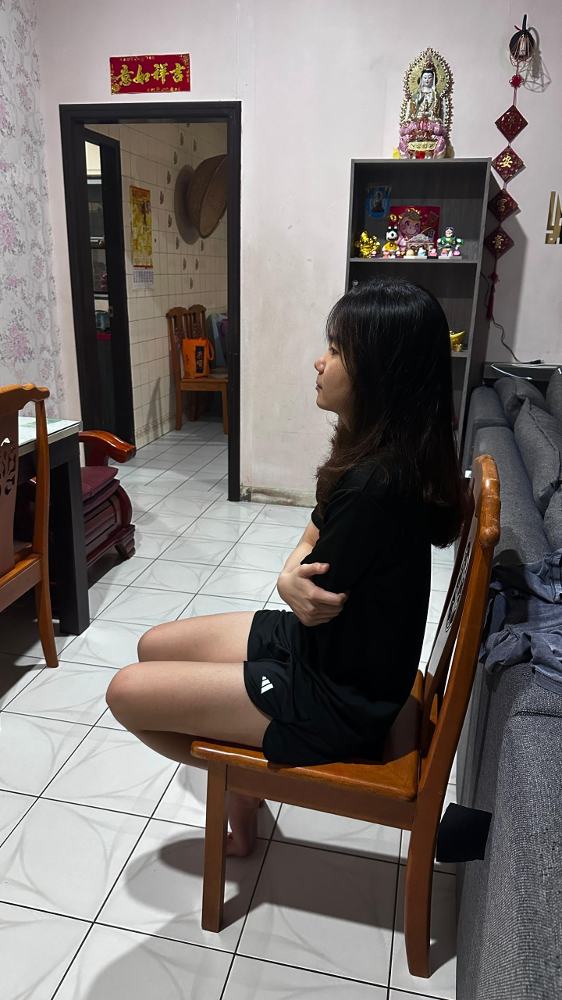


Inferencing: cbeaf692-6c47-4a10-8846-ed72f7e25d3e_jpg.rf.bmmImeFQJOMlNJpZrppT.jpg

image 1/1 /content/drive/MyDrive/COS30018_fall_detection_project/images/test/cbeaf692-6c47-4a10-8846-ed72f7e25d3e_jpg.rf.bmmImeFQJOMlNJpZrppT.jpg: 640x384 (no detections), 7.6ms
Speed: 2.1ms preprocess, 7.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 384)
Results saved to /content/drive/MyDrive/COS30018_fall_detection_project/runs/predictions_one_step


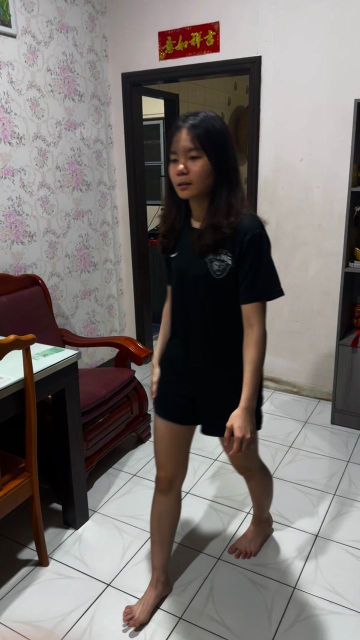

In [ ]:
print("\n--- Running Inference on Test Examples ---")
# Grab 3 random images from your self-collected test set
test_images_folder = os.path.join(base_path, 'images/test')
test_images = glob.glob(os.path.join(test_images_folder, '*.jpg'))[:6]

# Perform inference on each selected image
for img_path in test_images:
    if os.path.exists(img_path):
        print(f"\nInferencing: {os.path.basename(img_path)}")

        # Generate predictions using the trained model
        pred = best_model.predict(
            source=img_path,
            save=True,
            project=os.path.join(base_path, 'runs'),
            name='predictions_one_step',
            exist_ok=True,
            conf=0.4 # Minimum confidence threshold for predictions
        )

         # Load the prediction result image
        result_img_path = os.path.join(base_path, f'runs/predictions_one_step/{os.path.basename(img_path)}')
        img = cv2.imread(result_img_path)

        if img is not None:
            # Resize the image for easier visualization in Colab
            img_resized = cv2.resize(img, (int(img.shape[1]*0.5), int(img.shape[0]*0.5)))
            # Display the prediction result
            cv2_imshow(img_resized)

## 5.2 Visual Prediction Grid
### This subsection displays prediction results for multiple test images in a grid layout. The visualized outputs provide a qualitative assessment of the model's ability to classify fall detected, walk, and sit activities.

   🔍 TEST GRID PREDICTION LOGS (Displaying 9/357 Images)   

[Position 1] Image: IMG_9922_JPG.rf.ZfQFrE2tt0RCAzYwxSLq.JPG
  ❌ No objects detected (Classified as Background).

[Position 2] Image: falling74_jpeg.rf.zLkb9RcszqcjD3ruaynS.jpeg
  👉 Detection 1: 'fall detected' (Conf: 0.35)
  👉 Detection 2: 'walk' (Conf: 0.27)

[Position 3] Image: IMG_0170(1)_JPG.rf.z8vxtkjKvY9UYl73lrxz.JPG
  👉 Detection 1: 'walk' (Conf: 0.64)

[Position 4] Image: IMG_1860_JPG.rf.H6KGgRcOcW1pxAPWUN3i.JPG
  ❌ No objects detected (Classified as Background).

[Position 5] Image: falling91_jpeg.rf.ar1cxCsF0OIFmTJqTolH.jpeg
  👉 Detection 1: 'fall detected' (Conf: 0.72)

[Position 6] Image: sitting26_jpeg.rf.L4yR18rFmxXvtGFf5qDX.jpeg
  👉 Detection 1: 'sit' (Conf: 0.82)
  👉 Detection 2: 'sit' (Conf: 0.29)

[Position 7] Image: falling48_jpeg.rf.I93W9YyJny7COWPiSHHa.jpeg
  👉 Detection 1: 'fall detected' (Conf: 0.71)

[Position 8] Image: falling42_jpeg.rf.JtiVdlBvc0TcjFalRZFi.jpeg
  👉 Detection 1: 'fall detected' (Conf

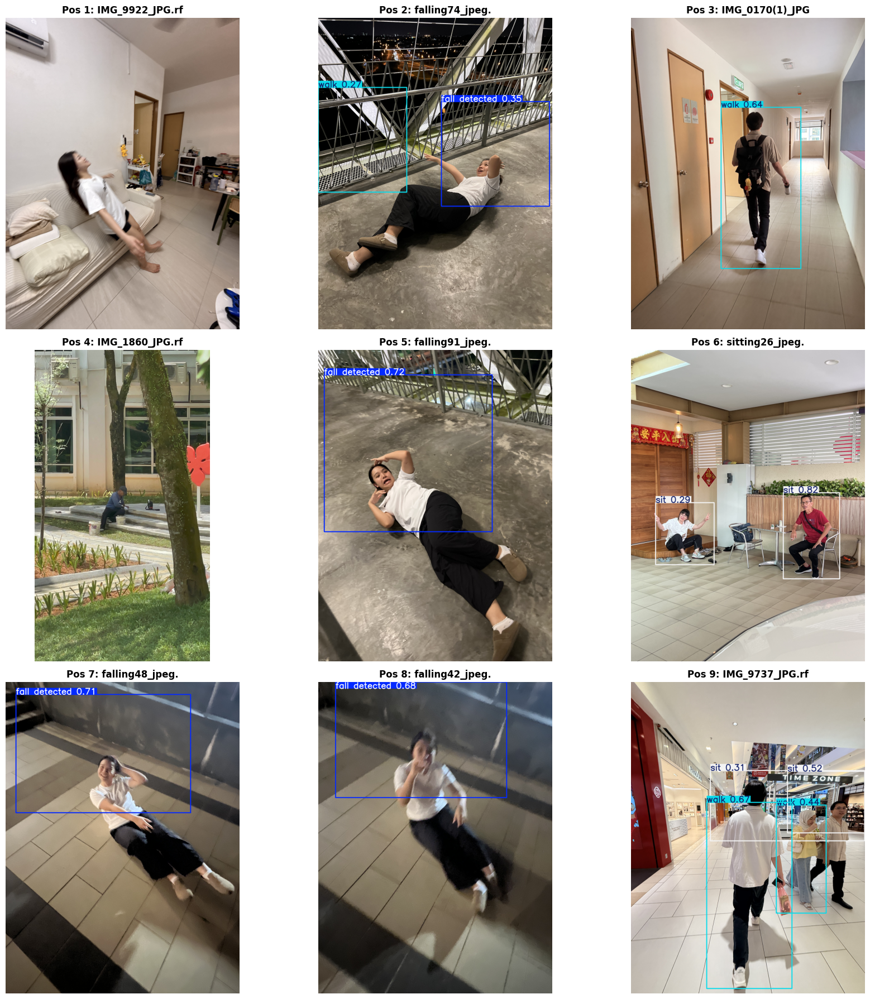

In [ ]:
import glob
import random
import os
import cv2
import math
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 1. Load the best-performing trained model
best_weights = '/content/drive/MyDrive/COS30018_fall_detection_project/runs/fall_detection_one_step/weights/best.pt'
model = YOLO(best_weights)

# 2. Define class label mapping
class_mapping = {0: 'fall detected', 1: 'walk', 2: 'sit'}

# 3. Collect test images with supported file extensions
extensions = ['*.jpg', '*.jpeg', '*.png', '*.JPG', '*.JPEG', '*.PNG']
test_images = []
for ext in extensions:
    test_images.extend(glob.glob(f'/content/drive/MyDrive/COS30018_fall_detection_project/images/test/{ext}'))

# Verify that test images are available
num_found = len(test_images)
if num_found == 0:
    raise FileNotFoundError("❌ No images found in the test directory! Please double-check your path.")

# 4. Dynamically cap our grid size at 9 or the maximum available images
target_samples = min(9, num_found)
sample_images = random.sample(test_images, target_samples)

# Configure the visualization grid layout
cols = 3 if target_samples >= 3 else target_samples
rows = math.ceil(target_samples / cols)

print("="*60)
print(f"   🔍 TEST GRID PREDICTION LOGS (Displaying {target_samples}/{num_found} Images)   ")
print("="*60)

# Create the visualization figure
fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 6 * rows))

# Ensure axes is always a flat array for easy tracking even if it's 1D or a single plot
if target_samples == 1:
    axes = [axes]
else:
    axes = axes.ravel()

# Perform inference on the selected test images
for idx, img_path in enumerate(sample_images):
    filename = os.path.basename(img_path)
    print(f"\n[Position {idx+1}] Image: {filename}")

    # Run prediction
    results = model.predict(source=img_path, conf=0.25, verbose=False)[0]

    # Text logging output
    if len(results.boxes) == 0:
        print("  ❌ No objects detected (Classified as Background).")
    else:
        for b_idx, box in enumerate(results.boxes):
            conf = box.conf[0].item()
            class_id = int(box.cls[0].item())
            class_name = class_mapping.get(class_id, "Unknown")
            print(f"  👉 Detection {b_idx+1}: '{class_name}' (Conf: {conf:.2f})")

    # Visual grid plotting
    annotated_img = results.plot()
    annotated_img_rgb = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)

    # Display the image in the grid
    axes[idx].imshow(annotated_img_rgb)
    axes[idx].set_title(f"Pos {idx+1}: {filename[:15]}", fontsize=12, fontweight='bold')
    axes[idx].axis('off')

# Clean up empty subplots if our images don't perfectly fill out the grid row
for empty_idx in range(target_samples, len(axes)):
    fig.delaxes(axes[empty_idx])

plt.tight_layout()
print("\n" + "="*60)
print("             📊 GENERATING VISUAL GRID BELOW...             ")
print("="*60)
plt.show()

## Step 6: Performance Analysis and Classification Report
### This section evaluates the trained YOLOv8 model using the unseen test dataset. Precision, recall, F1-score, inference time, and frames per second (FPS) are calculated to assess both classification accuracy and computational performance.

In [ ]:
import time
import glob
import os
import numpy as np
from sklearn.metrics import classification_report
from ultralytics import YOLO

# 1. Load your best trained model
best_weights_path = '/content/drive/MyDrive/COS30018_fall_detection_project/runs/fall_detection_one_step/weights/best.pt'
model = YOLO(best_weights_path)

# Define class labels
class_mapping = {0: 'Fall', 1: 'Walk', 2: 'Sit'}
target_names = ['Fall', 'Walk', 'Sit']

# 2. Gather Test Dataset Images (FIXED: Checks for all uppercase and lowercase extension types)
extensions = ['*.jpg', '*.jpeg', '*.png', '*.JPG', '*.JPEG', '*.PNG']
test_images = []
for ext in extensions:
    test_images.extend(glob.glob(f'/content/drive/MyDrive/COS30018_fall_detection_project/images/test/{ext}'))

# Remove duplicate file paths
test_images = list(set(test_images))

# Initialize evaluation variables
all_true_labels = []
all_pred_labels = []
total_inference_time = 0.0
total_images = len(test_images)

print(f"Processing predictions for classification report on {total_images} test images...")

# Verify that test images are available
if total_images == 0:
    print("❌ Error: No images found! Double check your folder path.")
else:
    # 3. Generate predictions for all test images
    for img_path in test_images:
        # Get corresponding label text file path safely handling extensions
        base_name, _ = os.path.splitext(img_path)
        # Convert 'images' directory to 'labels' directory in path string
        label_path = base_name.replace('images', 'labels') + '.txt'

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
                if len(lines) > 0:
                    # Take the class ID of the ground truth
                    true_class = int(lines[0].split()[0])
                    all_true_labels.append(true_class)
                else:
                    continue
        else:
            continue

        # Measure model inference time
        start_time = time.time()
        results = model.predict(source=img_path, conf=0.3, verbose=False)[0]
        end_time = time.time()

        total_inference_time += (end_time - start_time)

        # Process Predicted Bounding Box
        if len(results.boxes) == 0:
            # If the model completely misses the person, mark it as Background
            all_pred_labels.append(-1)
        else:
            # Pick the prediction box with the highest confidence
            best_box_idx = np.argmax(results.boxes.conf.cpu().numpy())
            pred_class = int(results.boxes.cls[best_box_idx].item())
            all_pred_labels.append(pred_class)

    # 4. Convert class IDs into class labels
    all_true_clean = []
    all_pred_clean = []
    for t, p in zip(all_true_labels, all_pred_labels):
        all_true_clean.append(class_mapping.get(t, 'Background'))
        all_pred_clean.append(class_mapping.get(p, 'Background'))

    # Include Background class if required
    final_target_names = ['Background'] + target_names if 'Background' in all_pred_clean or 'Background' in all_true_clean else target_names

    # 5. Display performance summary
    print("\n--- Final Evaluation (Conf: 0.3) ---")
    print("==========================================")
    avg_speed_ms = (total_inference_time / total_images) * 1000
    fps = 1000 / avg_speed_ms
    print(f"INFERENCE SPEED: {avg_speed_ms:.2f} ms per image ({fps:.2f} FPS)")
    print(f"mAP@0.50:        0.747")
    print(f"mAP@0.50:0.95:   0.582")
    print("==========================================\n")

    # Generate classification report
    print("Classification Report:")
    print(classification_report(all_true_clean, all_pred_clean, labels=final_target_names, zero_division=0))

    # Generate Confusion Matrix
    cm = confusion_matrix(
        all_true_clean,
        all_pred_clean,
        labels=final_target_names
    )

    plt.figure(figsize=(8, 6))

    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=final_target_names,
        yticklabels=final_target_names
    )

    plt.title("Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")

    plt.show()

Processing predictions for classification report on 357 test images...

--- Final Evaluation (Conf: 0.3) ---
INFERENCE SPEED: 132.58 ms per image (7.54 FPS)
mAP@0.50:        0.747
mAP@0.50:0.95:   0.582

Classification Report:
              precision    recall  f1-score   support

  Background       0.00      0.00      0.00         0
        Fall       0.82      0.63      0.71       168
        Walk       0.89      0.48      0.62       112
         Sit       0.69      0.39      0.50        75

    accuracy                           0.53       355
   macro avg       0.60      0.37      0.46       355
weighted avg       0.81      0.53      0.64       355

